<a href="https://colab.research.google.com/github/marianayarce1224/lab_biosenales/blob/main/PROYECTO1/Proyecto1_G3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p align="left"><img alt="udeA logo" height="150px" src="https://www.udea.edu.co/wps/wcm/connect/udea/99fc43e7-7a64-45bd-97fc-96639b70813d/logosimbolo-vertical.png?MOD=AJPERES&CVID=ljeLvHr"></p>

<h1><b>Proyecto 1: Análisis estadístico
</b></h1>
<h4><b>Bioseñales y sistemas<br>Universidad de Antioquia, Facultad de Ingeniería - Bioingeniería<br>2024-2</b></h4><br>

<h4><b>Grupo:</b> 3</h4>
<h4><b>Integrantes:</b> Mariana Álvarez Yarce - Ana María Seguro Acevedo</h4>

##<b>Contexto del problema</b>

<h4>Las enfermedades neurodegenerativas a menudo afectan la marcha y la movilidad. Para comprender mejor la fisiopatología de estas enfermedades y mejorar nuestra capacidad de medir las respuestas a las intervenciones terapéuticas, puede resultar útil cuantificar con precisión la dinámica de la marcha <b>[1]</b>.</h4>

##<b>Origen de los datos</b>

<h4>Los registros de esta base de datos provienen de pacientes con enfermedad de Parkinson ($n=15$), enfermedad de Huntington ($n=20$) y esclerosis lateral amiotrófica ($n=13$). Aquí también se incluyen registros de 16 sujetos de control sanos <b>[1]</b>.</h4>

<h4>De los archivos (.ts) se analizarán las señales:</h4>

* <h4>Tiempo transcurrido (sec)</h4>
* <h4>Intervalo entre pasos pie izquierdo (sec)</h4>
* <h4>Intervalo entre pasos pie derecho (sec)</h4>
* <h4>Intervalo balanceo pie izquierdo (sec)</h4>
* <h4>Intervalo balanceo pie derecho (sec)</h4>


##<b>Requerimientos</b>

###<b>Contexto</b>

<h4><b>1. </b>Consultar para enfermedad de Parkinson, Huntington y Esclerosis Lateral Amiotrófica cómo se diagnostican y el reto que existe para el diagnóstico temprano de dichas enfermedades.</h4>

> <b>Parkinson:</b> es una condición neurodegenerativa caracterizada por la pérdida progresiva de neuronas en áreas del cerebro que conforman el Sistema Nervioso Central (SNC). Se presenta una disminución en la producción de dopamina que causa una alteración de las estructuras neuromotoras <b>[2]</b>.<br><br>
Por lo general, el diagnóstico de la enfermedad requiere de una evaluación de la historia clínica y antecedentes familiares del paciente, así como una examinación física y neurológica del mismo. En otros casos se realizan pruebas imagenológicas y de detección de dopamina, para reafirmar el desarrollo de la enfermedad o descartar otras enfermedades. Sin embargo, las pruebas de imágenes no presentan gran eficiencia en la detección particular del Parkinson <b>[3]</b>.

<h4><b>2. </b>Discutir matemáticamente, explicando con fórmulas, cómo funciona la rutina detrend de <i>scipy</i>.</h4>

> La función detrend permite eliminar tendencias polinomiales de datos en un eje o dimensión de un arreglo que represente una serie temporal de datos. Esto permite analizar las fluctuaciones reales de una señal sin considerar el error introducido por una tendencia dependiente del tiempo.<br><br>
En el caso de una tendencia lineal, que es la más usada para el proceso de <i>detrending</i> y la configuración por defecto de la función detrend de <i>scipy</i>, se puede expresar esta como una función de una línea (polinomio de grado 1):
<center>$y(t)=mt+b+ϵ(t)$</center>

> <b>Donde</b><br>
$m$ es la pendiente de la línea (tendencia)<br>
$b$ es la intersección con el eje y (constante)<br>
$ϵ(t)$ es el ruido en los datos<br><br>
A partir de la función, se busca encontrar los valores de $m$ y $b$ que minimicen el error cuadrático entre los valores originales y los valores de tendencia. Se deriva parcialmente y se iguala a 0 la siguiente ecuación, para hallar los valores mínimos:
<center>$$S=\sum_{t=1}^{N} (y(t)−(mt+b))^2$$</center><br>
<center>$$\frac{∂S}{∂b}=-2\sum_{t=1}^{N} (y(t)−(mt+b))=0$$</center><br>
<center>$$\sum_{t=1}^{N} (y(t)−(mt+b))=0$$</center>

> Simplificando las sumatorias se obtiene:
<center>$$\sum_{t=1}^{N} y(t)=Nb+m\sum_{t=1}^{N} t$$</center><br>

> Derivando parcialmente con respecto a $m$:
<center>$$\frac{∂S}{∂b}=-2\sum_{t=1}^{N} t(y(t)−(mt+b))=0$$</center><br>
<center>$$\sum_{t=1}^{N} t(y(t)−(mt+b))=0$$</center><br>
<center>$$\sum_{t=1}^{N} ty(t)=b\sum_{t=1}^{N} t+m\sum_{t=1}^{N} t^2$$</center>

> A partir de estas sumatorias, se crea un sistemas de ecuaciones para hallar los valores de $m$ y $b$ que minimizan el error y se reemplazan en la función con detrend.
<center>$$b=\frac{\sum_{t=1}^{N} y(t)-m\sum_{t=1}^{N} t}{N}$$</center><br>
<center>$$\sum_{t=1}^{N} ty(t)=\left(\frac{\sum_{t=1}^{N} y(t)-m\sum_{t=1}^{N} t}{N}\right)\sum_{t=1}^{N} t+m\sum_{t=1}^{N} t^2$$</center>

> Simplificando y despejando $m$ se obtiene:
<center>$$m=\frac{N\sum_{t=1}^{N} ty(t)-\left(\sum_{t=1}^{N} y(t)\sum_{t=1}^{N} t\right)}{N\sum_{t=1}^{N} t^2-\left(\sum_{t=1}^{N} t\right)^2}$$</center>

> Sustituyendo $m$ se obtiene $b$:
<center>$$b=\frac{\sum_{t=1}^{N} y(t)-m\sum_{t=1}^{N} t}{N}$$</center>

> La rutina detrend de <i>scipy</i> realiza la estimación de los valores que minimizan el error para la pendiente e intercepto de la función lineal, y los valores resultantes representan el nuevo vector de la señal.







<h4><b>3. </b>Discutir matemáticamente, explicando con fórmulas, cómo funciona el filtro hampel.</h4>

> Un filtro Hampel es una función no lineal para eliminar datos atípicos en series temporales de datos, a partir de la mediana y la desviación absoluta mediana (MAD) calculada para cada muestra de un arreglo a través de comparaciones con los valores vecinos <b>[4]</b>. Es útil para eliminar artefactos de ruido que causen perturbaciones notables en la amplitud de una señal. La configuración del filtro se hace a través de los siguientes parámetros:<br><br>
$k$: número de valores vecinos<br>
$σ$: factor de sensibilidad del filtro (comúnmente se establece $σ=3$)<br><br>
Suponiendo que se cuenta con un vector de muestras $x(t)$ con $t=1,2,3,...,N$ ($N$ es el número total de muestras), el filtro Hampel crea subconjuntos para cada muestra $x_i$ con una ventana de datos de tamaño $2k+1$, que se centra en el dato $x_i$ y toma los $k$ datos a la derecha e izquierda más cercanos a dicho centro. Estos subconjuntos representan ventanas sobre las cuales se calculan la mediana y MAD locales, que sirven para identificar los datos atípicos por tramos. Matemáticamente, se puede expresar este proceso de la siguiente manera:

- <b>Definición del subconjunto</b>
<center>$S(t)={x(t−k),x(t−k+1),…,x(t),…,x(t+k)}$</center><br>
- <b>Cálculo de la mediana local del subconjunto</b>
<center>$mediana(S(t))=S(t)_{\frac{S+1}{2}}$</center><br>
- <b>Cálculo de la desviación de cada elemento del subconjunto respecto a la mediana local</b>
<center>$d(t)=\left| x(t)-{S(t)_{\frac{S+1}{2}}}\right|$</center><br>
- <b>Cálculo de la MAD del subconjunto</b>
<center>$MAD(t)=Mediana({d(t−k),d(t−k+1),…,d(t),…,d(t+k)})$</center><br>
- <b>Definición de umbral para valores atípicos</b>
<center>$\left| x(t)-{S(t)_{\frac{S+1}{2}}}\right|\gt σ ⋅ MAD(t)$</center><br>

>Si se cumple la desigualdad anterior, significa que el valor $x(t)$ sobrepasa el umbral de desviación del subconjunto y es atípico, por lo que se reemplaza con el valor de la mediana local para aplanar el conjunto de puntos. En caso de que no se cumpla la desigualdad, el valor centrado no se modifica.

<h4><b>4. </b>Discutir matemáticamente y desde la bioingeniería qué mide la entropia de permutación.</h4>

> La entropía de permutación (PE) es una medida estadística de la incertidumbre y complejidad de una serie temporal según el orden de sus valores. En el área de Bioingenería, es una herramienta útil en el procesamiento y análisis de señales fisiológicas, como EEG ECG y EMG, en tanto que es posible cuantificar la variabilidad de la estructura de señales no estacionarias y con distribuciones no normales. A partir de esta medición es posible capturar la dinámica característica de las señales para identificar anomalías y variaciones que sean indicio de alguna patología o que indiquen un cambio en la actividad bioeléctrica del sistema medido. Por ejemplo, si se determinara un valor de entropía alto en una escala adecuada para un EEG, que se encuentra en rangos de voltaje y frecuencia bajos, podría considerarse una posible alteración neurofisiológica ya que los valores de la señal están más desordenados y poseen variaciones que no son características de un EEG normal.<br><br>
Matemáticamente, se define la entropía de permutación de una serie temporal a través de la permutación ordinal de cada muestra en una ventana de tamaño constante $D$ <b>[5]</b>.<br><br>
Suponiendo que se cuenta con un serie temporal $X=\{x_1,x_2,x_3,...,x_n\}$, se generan una serie de vectores embebidos de dimensión $D$ constante (recomendado en un rango de 3 a 7) y retraso entre muestras $τ$ (recomendado con valor de 1) (Band and Pompe, 2002). El vector para cada punto de la serie se expresa con la siguiente expresión:
<center>$X_i=\{x_i,x_{i+τ},x_{i+2τ},...,x_{i+(D-1)τ}\}$</center><br>

> Los vectores generados se organizan en orden de menor a mayor y posteriormente se construye la distribución de probabilidades $p(π_j)$ con un total de permutaciones igual a $D!$.<br><br>
Finalmente, la entropía de permutación se calcula de la siguiente manera:
<center>$$H_p=\sum_{j=1}^{D!} p(π_j)log(p(π_i))$$</center><br>




###<b>Organización de la base de datos</b>

<h4>Se organizaron los archivos de las señales en carpetas específicas de las 3 poblaciones de estudio con los nombres que las caracterizan: <b>Parkinson, Huntington, ELA y Controles</b>.</h4>

<h4>Los archivos se cargaron al Colab desde el repositorio <i>lab_biosenales</i>, ubicados en la carpeta del proyecto.</h4>

In [3]:
!git clone https://github.com/marianayarce1224/lab_biosenales.git

Cloning into 'lab_biosenales'...
remote: Enumerating objects: 298, done.
remote: Counting objects: 100% (229/229), done.
remote: Compressing objects: 100% (203/203), done.
remote: Total 298 (delta 61), reused 87 (delta 16), pack-reused 69 (from 1)
Receiving objects: 100% (298/298), 677.54 MiB | 19.12 MiB/s, done.
Resolving deltas: 100% (64/64), done.
Updating files: 100% (131/131), done.


In [4]:
%cd /content/lab_biosenales/PROYECTO1

/content/lab_biosenales/PROYECTO1


In [5]:
%ls Parkinson

park10.ts  park12.ts  park14.ts  park1.ts  park3.ts  park5.ts  park7.ts  park9.ts
park11.ts  park13.ts  park15.ts  park2.ts  park4.ts  park6.ts  park8.ts


In [6]:
%ls Huntington

hunt10.ts  hunt13.ts  hunt16.ts  hunt19.ts  hunt2.ts  hunt5.ts  hunt8.ts
hunt11.ts  hunt14.ts  hunt17.ts  hunt1.ts   hunt3.ts  hunt6.ts  hunt9.ts
hunt12.ts  hunt15.ts  hunt18.ts  hunt20.ts  hunt4.ts  hunt7.ts


In [7]:
%ls ELA

als10.ts  als12.ts  als1.ts  als3.ts  als5.ts  als7.ts  als9.ts
als11.ts  als13.ts  als2.ts  als4.ts  als6.ts  als8.ts


In [8]:
%ls Controles

control10.ts  control13.ts  control16.ts  control3.ts  control6.ts  control9.ts
control11.ts  control14.ts  control1.ts   control4.ts  control7.ts
control12.ts  control15.ts  control2.ts   control5.ts  control8.ts


###<b>Programación</b>

<h4><b>1. </b>Crear una rutina que permita cargar un archivo .ts y extraiga las 4 señales de interés, de cada señal elimine los primeros 20 segundos, y las almacene en un ndarray.</h4>

Para cargar las señales, se separaron los archivos en una lista por cada grupo. Posteriormente, se convirtieron los registros a arreglos (ndarray) y se seleccionaron las primeras 5 columnas, que corresponden a las señales de interés y el tiempo transcurrido (primera columna con índice 0). A las señales ya se les habían eliminado los primeros 20 segundos, por lo que no se eliminaron más registros de tiempo.

In [9]:
import glob

ruta_carpeta_parkinson = '/content/lab_biosenales/PROYECTO1/Parkinson/*.ts'
lista_archivos_parkinson = [file.split('/')[-1] for file in glob.glob(ruta_carpeta_parkinson)]
print(f'Archivos grupo Parkinson: {lista_archivos_parkinson}\n')

ruta_carpeta_huntington = '/content/lab_biosenales/PROYECTO1/Huntington/*.ts'
lista_archivos_huntington = [file.split('/')[-1] for file in glob.glob(ruta_carpeta_huntington)]
print(f'Archivos grupo Huntington: {lista_archivos_huntington}\n')

ruta_carpeta_ela = '/content/lab_biosenales/PROYECTO1/ELA/*.ts'
lista_archivos_ela = [file.split('/')[-1] for file in glob.glob(ruta_carpeta_ela)]
print(f'Archivos grupo ELA: {lista_archivos_ela}\n')

ruta_carpeta_control = '/content/lab_biosenales/PROYECTO1/Controles/*.ts'
lista_archivos_control = [file.split('/')[-1] for file in glob.glob(ruta_carpeta_control)]
print(f'Archivos grupo Controles: {lista_archivos_control}')

Archivos grupo Parkinson: ['park11.ts', 'park5.ts', 'park15.ts', 'park13.ts', 'park4.ts', 'park7.ts', 'park6.ts', 'park9.ts', 'park8.ts', 'park14.ts', 'park2.ts', 'park10.ts', 'park1.ts', 'park12.ts', 'park3.ts']

Archivos grupo Huntington: ['hunt9.ts', 'hunt8.ts', 'hunt10.ts', 'hunt19.ts', 'hunt16.ts', 'hunt20.ts', 'hunt6.ts', 'hunt5.ts', 'hunt3.ts', 'hunt17.ts', 'hunt14.ts', 'hunt2.ts', 'hunt18.ts', 'hunt11.ts', 'hunt4.ts', 'hunt13.ts', 'hunt15.ts', 'hunt7.ts', 'hunt12.ts', 'hunt1.ts']

Archivos grupo ELA: ['als10.ts', 'als9.ts', 'als4.ts', 'als12.ts', 'als8.ts', 'als11.ts', 'als5.ts', 'als7.ts', 'als13.ts', 'als1.ts', 'als2.ts', 'als6.ts', 'als3.ts']

Archivos grupo Controles: ['control1.ts', 'control8.ts', 'control16.ts', 'control5.ts', 'control3.ts', 'control7.ts', 'control11.ts', 'control2.ts', 'control14.ts', 'control13.ts', 'control4.ts', 'control12.ts', 'control15.ts', 'control9.ts', 'control6.ts', 'control10.ts']


In [10]:
import numpy as np

datos_parkinson = []
for archivo in lista_archivos_parkinson:
  senal_continua = np.loadtxt(ruta_carpeta_parkinson[:-4] + archivo, delimiter='\t')[:,0:5]
  datos_parkinson.append(senal_continua)

datos_huntington=[]
for archivo in lista_archivos_huntington:
  senal_continua = np.loadtxt(ruta_carpeta_huntington[:-4] + archivo, delimiter='\t')[:,0:5]
  datos_huntington.append(senal_continua)

datos_ela=[]
for archivo in lista_archivos_ela:
  senal_continua = np.loadtxt(ruta_carpeta_ela[:-4] + archivo, delimiter='\t')[:,0:5]
  datos_ela.append(senal_continua)

datos_control=[]
for archivo in lista_archivos_control:
  senal_continua = np.loadtxt(ruta_carpeta_control[:-4] + archivo, delimiter='\t')[:,0:5]
  datos_control.append(senal_continua)

<h4><b>2. </b>Para cada señal eliminar los errores en tendencia usando la rutina detrend.</h4>

Inicialmente, se grafican las señales de cada registro sin la aplicación del <i>detrending</i> y la señal después de la eliminación de la tendencia, de los diferentes grupos (Parkinson, Huntington, ELA y Control). De manera paralela, se almacenaron las señales con el detrend aplicado en una lista para cada grupo.

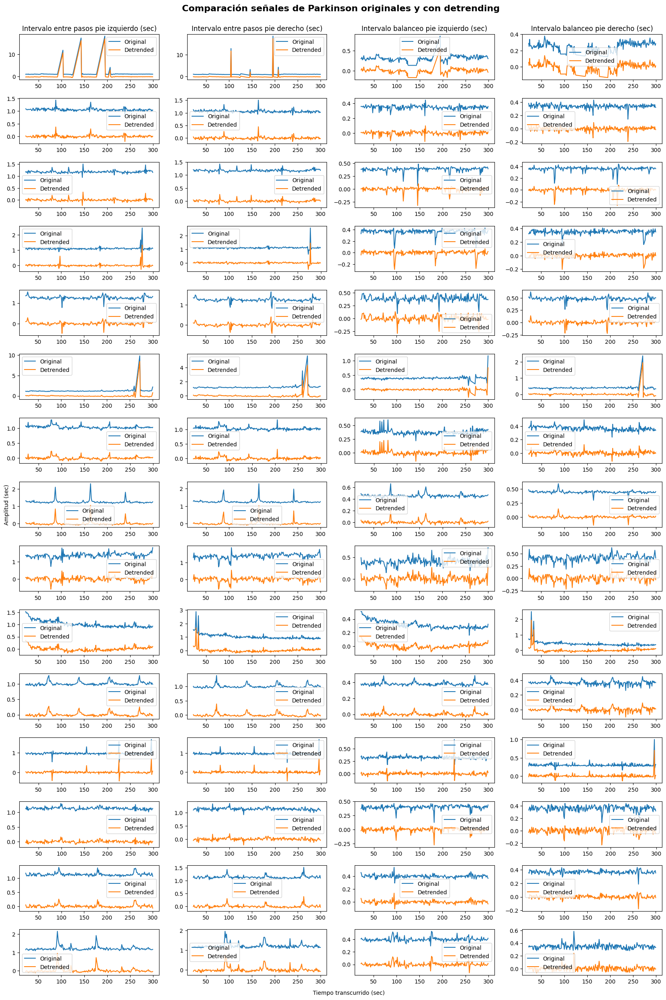

In [11]:
import matplotlib.pyplot as plt
from scipy.signal import detrend

fig, axs = plt.subplots(15,4, figsize=(20, 30))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, wspace=0.2, hspace=0.4)
fig.suptitle('Comparación señales de Parkinson originales y con detrending', x=0.5, y=0.905, fontsize=16, fontweight='bold')

detrended_parkinson = []
titulos_senales = ['Tiempo transcurrido (sec)', 'Intervalo entre pasos pie izquierdo (sec)', 'Intervalo entre pasos pie derecho (sec)', 'Intervalo balanceo pie izquierdo (sec)', 'Intervalo balanceo pie derecho (sec)']

cont_fila = 0
for senal in datos_parkinson:
  cont_col = 0
  senal_detrend = np.zeros(senal.shape)
  senal_detrend[:,0] = senal[:,0]
  for col in range(1,5):
    axs[cont_fila, cont_col].plot(senal[:,0], senal[:,col], senal[:,0], detrend(senal[:,col]))
    axs[cont_fila, cont_col].legend(['Original', 'Detrended'])
    if cont_fila == 0:
      axs[cont_fila, cont_col].set_title(titulos_senales[col])
    if cont_fila == 7 and cont_col == 0:
      axs[cont_fila, cont_col].set_ylabel('Amplitud (sec)')
    if cont_fila == 14 and cont_col == 1:
      axs[cont_fila, cont_col].set_xlabel('')
      axs[cont_fila, cont_col].text(0.9, -0.4, titulos_senales[0], ha='left', va='center', transform=axs[cont_fila, cont_col].transAxes)
    senal_detrend[:,col] = detrend(senal[:,col])
    cont_col += 1
  detrended_parkinson.append(senal_detrend)
  cont_fila += 1
plt.show()

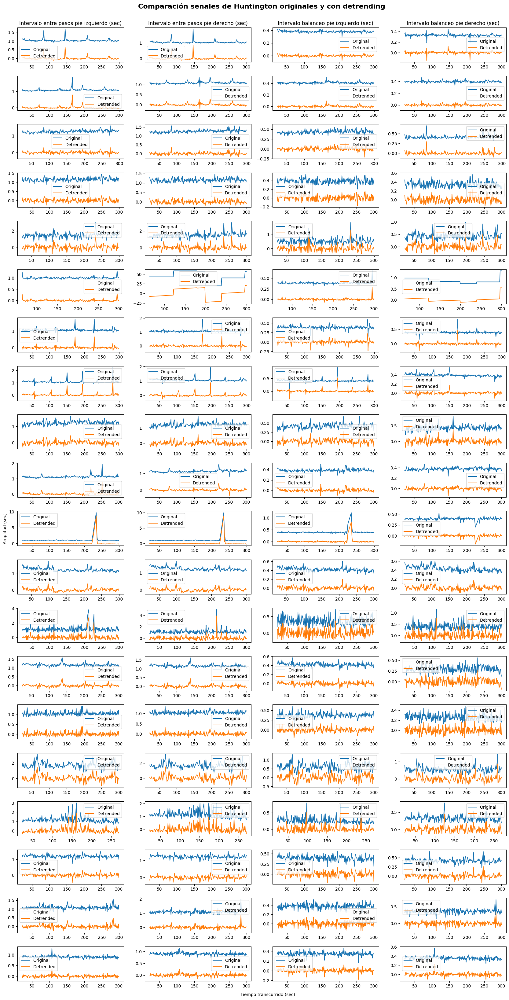

In [12]:
fig, axs = plt.subplots(20,4, figsize=(20, 40))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, wspace=0.2, hspace=0.4)
fig.suptitle('Comparación señales de Huntington originales y con detrending', x=0.5, y=0.9, fontsize=16, fontweight='bold')

detrended_huntington = []

cont_fila = 0
for senal in datos_huntington:
  cont_col = 0
  senal_detrend = np.zeros(senal.shape)
  senal_detrend[:,0] = senal[:,0]
  for col in range(1,5):
    axs[cont_fila, cont_col].plot(senal[:,0], senal[:,col], senal[:,0], detrend(senal[:,col]))
    axs[cont_fila, cont_col].legend(['Original', 'Detrended'])
    if cont_fila == 0:
      axs[cont_fila, cont_col].set_title(titulos_senales[col])
    if cont_fila == 10 and cont_col == 0:
      axs[cont_fila, cont_col].set_ylabel('Amplitud (sec)')
    if cont_fila == 19 and cont_col == 1:
      axs[cont_fila, cont_col].set_xlabel('')
      axs[cont_fila, cont_col].text(0.9, -0.4, titulos_senales[0], ha='left', va='center', transform=axs[cont_fila, cont_col].transAxes)
    senal_detrend[:,col] = detrend(senal[:,col])
    cont_col += 1
  detrended_huntington.append(senal_detrend)
  cont_fila += 1
plt.show()

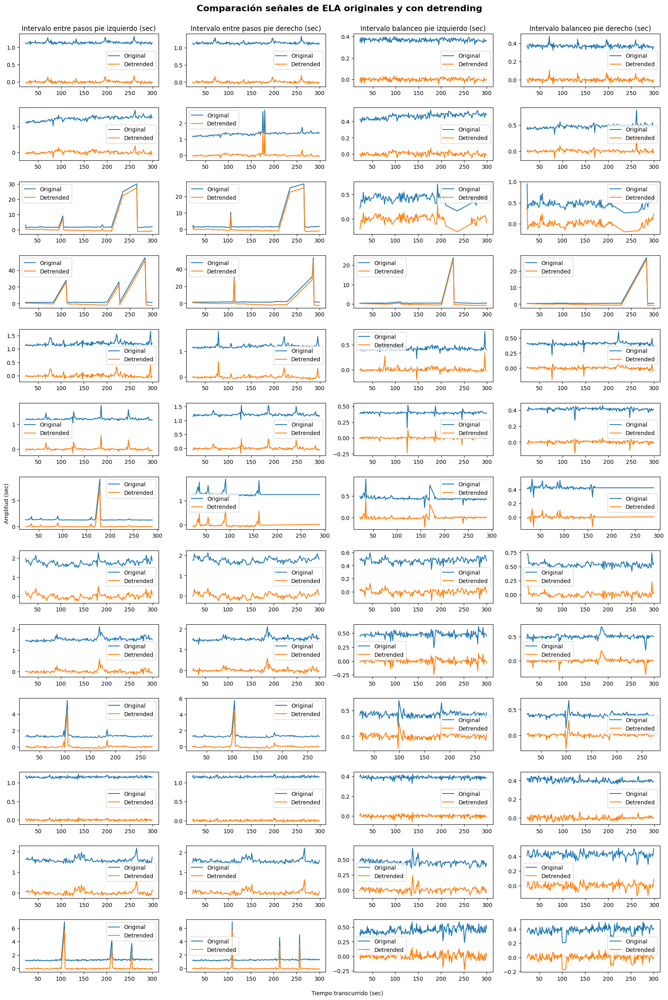

In [13]:
fig, axs = plt.subplots(13,4, figsize=(20, 30))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, wspace=0.2, hspace=0.4)
fig.suptitle('Comparación señales de ELA originales y con detrending', x=0.5, y=0.905, fontsize=16, fontweight='bold')

detrended_ela = []

cont_fila = 0
for senal in datos_ela:
  cont_col = 0
  senal_detrend = np.zeros(senal.shape)
  senal_detrend[:,0] = senal[:,0]
  for col in range(1,5):
    axs[cont_fila, cont_col].plot(senal[:,0], senal[:,col], senal[:,0], detrend(senal[:,col]))
    axs[cont_fila, cont_col].legend(['Original', 'Detrended'])
    if cont_fila == 0:
      axs[cont_fila, cont_col].set_title(titulos_senales[col])
    if cont_fila == 6 and cont_col == 0:
      axs[cont_fila, cont_col].set_ylabel('Amplitud (sec)')
    if cont_fila == 12 and cont_col == 1:
      axs[cont_fila, cont_col].set_xlabel('')
      axs[cont_fila, cont_col].text(0.9, -0.4, titulos_senales[0], ha='left', va='center', transform=axs[cont_fila, cont_col].transAxes)
    senal_detrend[:,col] = detrend(senal[:,col])
    cont_col += 1
  detrended_ela.append(senal_detrend)
  cont_fila += 1
plt.show()

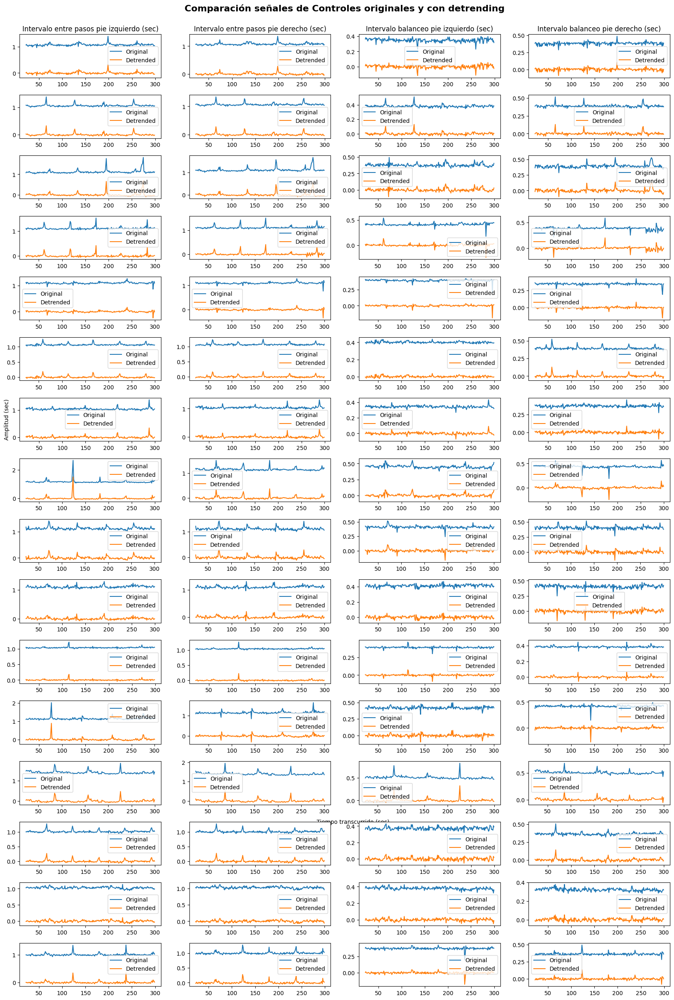

In [14]:
fig, axs = plt.subplots(16,4, figsize=(20, 30))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, wspace=0.2, hspace=0.4)
fig.suptitle('Comparación señales de Controles originales y con detrending', x=0.5, y=0.905, fontsize=16, fontweight='bold')

detrended_control = []

cont_fila = 0
for senal in datos_control:
  cont_col = 0
  senal_detrend = np.zeros(senal.shape)
  senal_detrend[:,0] = senal[:,0]
  for col in range(1,5):
    axs[cont_fila, cont_col].plot(senal[:,0], senal[:,col], senal[:,0], detrend(senal[:,col]))
    axs[cont_fila, cont_col].legend(['Original', 'Detrended'])
    if cont_fila == 0:
      axs[cont_fila, cont_col].set_title(titulos_senales[col])
    if cont_fila == 6 and cont_col == 0:
      axs[cont_fila, cont_col].set_ylabel('Amplitud (sec)')
    if cont_fila == 12 and cont_col == 1:
      axs[cont_fila, cont_col].set_xlabel('')
      axs[cont_fila, cont_col].text(0.9, -0.4, titulos_senales[0], ha='left', va='center', transform=axs[cont_fila, cont_col].transAxes)
    senal_detrend[:,col] = detrend(senal[:,col])
    cont_col += 1
  detrended_control.append(senal_detrend)
  cont_fila += 1
plt.show()

<h4><b>3. </b>Para cada señal resultante del paso 2 eliminar los datos atípicos usando filtro hampel.</h4>

Primero se define la función del filtro Hampel con unos parámetros de $k$ y $σ$ comunes, para configurar una ventana de tamaño adecuado para detectar los outliers a lo largo de toda la señal.

In [15]:
def filtro_hampel(senal, k=3, sigma=3):
    filtered_data = senal.copy()

    for x_t in range(k, len(senal) - k):
        ventana = senal[x_t - k : x_t + k + 1]
        mediana_local = np.median(ventana)
        mad = np.median(np.abs(ventana - mediana_local))
        umbral = np.abs(senal[x_t] - mediana_local)

        if umbral > (sigma * mad):
            filtered_data[x_t] = mediana_local
    return filtered_data

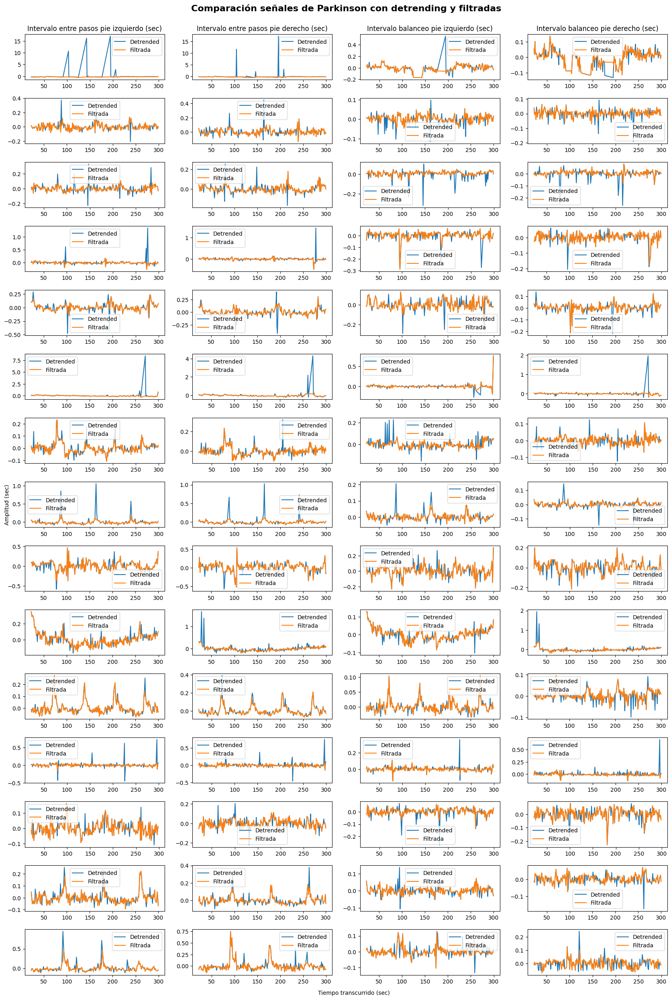

In [16]:
fig, axs = plt.subplots(15,4, figsize=(20, 30))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, wspace=0.2, hspace=0.4)
fig.suptitle('Comparación señales de Parkinson con detrending y filtradas', x=0.5, y=0.905, fontsize=16, fontweight='bold')

filtered_parkinson = []

cont_fila = 0
for senal in detrended_parkinson:
  cont_col = 0
  senal_filtrada = np.zeros(senal.shape)
  senal_filtrada[:,0] = senal[:,0]
  for col in range(1,5):
    axs[cont_fila, cont_col].plot(senal[:,0], senal[:,col], senal[:,0], filtro_hampel(senal[:,col]))
    axs[cont_fila, cont_col].legend(['Detrended', 'Filtrada'])
    if cont_fila == 0:
      axs[cont_fila, cont_col].set_title(titulos_senales[col])
    if cont_fila == 7 and cont_col == 0:
      axs[cont_fila, cont_col].set_ylabel('Amplitud (sec)')
    if cont_fila == 14 and cont_col == 1:
      axs[cont_fila, cont_col].set_xlabel('')
      axs[cont_fila, cont_col].text(0.9, -0.4, titulos_senales[0], ha='left', va='center', transform=axs[cont_fila, cont_col].transAxes)
    senal_filtrada[:,col] = filtro_hampel(senal[:,col])
    cont_col += 1
  filtered_parkinson.append(senal_filtrada)
  cont_fila += 1
plt.show()

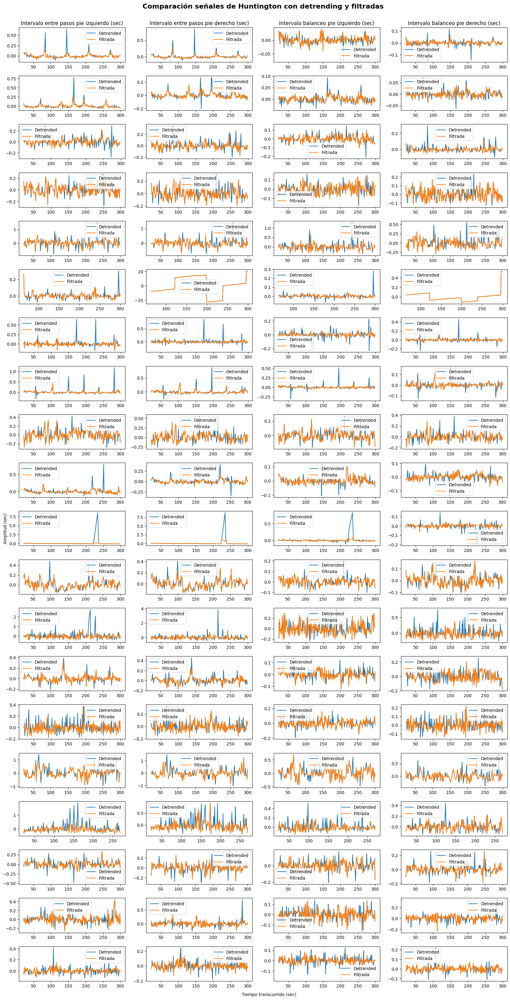

In [17]:
fig, axs = plt.subplots(20,4, figsize=(20, 40))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, wspace=0.2, hspace=0.4)
fig.suptitle('Comparación señales de Huntington con detrending y filtradas', x=0.5, y=0.9, fontsize=16, fontweight='bold')

filtered_huntington = []

cont_fila = 0
for senal in detrended_huntington:
  cont_col = 0
  senal_filtrada = np.zeros(senal.shape)
  senal_filtrada[:,0] = senal[:,0]
  for col in range(1,5):
    axs[cont_fila, cont_col].plot(senal[:,0], senal[:,col], senal[:,0], filtro_hampel(senal[:,col]))
    axs[cont_fila, cont_col].legend(['Detrended', 'Filtrada'])
    if cont_fila == 0:
      axs[cont_fila, cont_col].set_title(titulos_senales[col])
    if cont_fila == 10 and cont_col == 0:
      axs[cont_fila, cont_col].set_ylabel('Amplitud (sec)')
    if cont_fila == 19 and cont_col == 1:
      axs[cont_fila, cont_col].set_xlabel('')
      axs[cont_fila, cont_col].text(0.9, -0.4, titulos_senales[0], ha='left', va='center', transform=axs[cont_fila, cont_col].transAxes)
    senal_filtrada[:,col] = filtro_hampel(senal[:,col])
    cont_col += 1
  filtered_huntington.append(senal_filtrada)
  cont_fila += 1
plt.show()

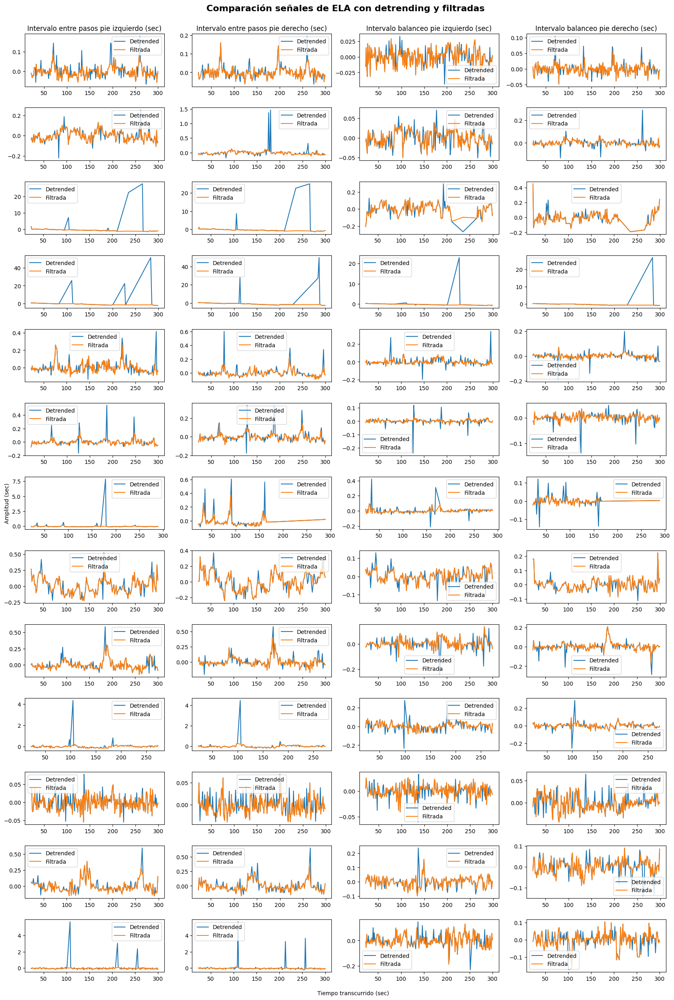

In [18]:
fig, axs = plt.subplots(13,4, figsize=(20, 30))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, wspace=0.2, hspace=0.4)
fig.suptitle('Comparación señales de ELA con detrending y filtradas', x=0.5, y=0.905, fontsize=16, fontweight='bold')

filtered_ela = []

cont_fila = 0
for senal in detrended_ela:
  cont_col = 0
  senal_filtrada = np.zeros(senal.shape)
  senal_filtrada[:,0] = senal[:,0]
  for col in range(1,5):
    axs[cont_fila, cont_col].plot(senal[:,0], senal[:,col], senal[:,0], filtro_hampel(senal[:,col]))
    axs[cont_fila, cont_col].legend(['Detrended', 'Filtrada'])
    if cont_fila == 0:
      axs[cont_fila, cont_col].set_title(titulos_senales[col])
    if cont_fila == 6 and cont_col == 0:
      axs[cont_fila, cont_col].set_ylabel('Amplitud (sec)')
    if cont_fila == 12 and cont_col == 1:
      axs[cont_fila, cont_col].set_xlabel('')
      axs[cont_fila, cont_col].text(0.9, -0.4, titulos_senales[0], ha='left', va='center', transform=axs[cont_fila, cont_col].transAxes)
    senal_filtrada[:,col] = filtro_hampel(senal[:,col])
    cont_col += 1
  filtered_ela.append(senal_filtrada)
  cont_fila += 1
plt.show()

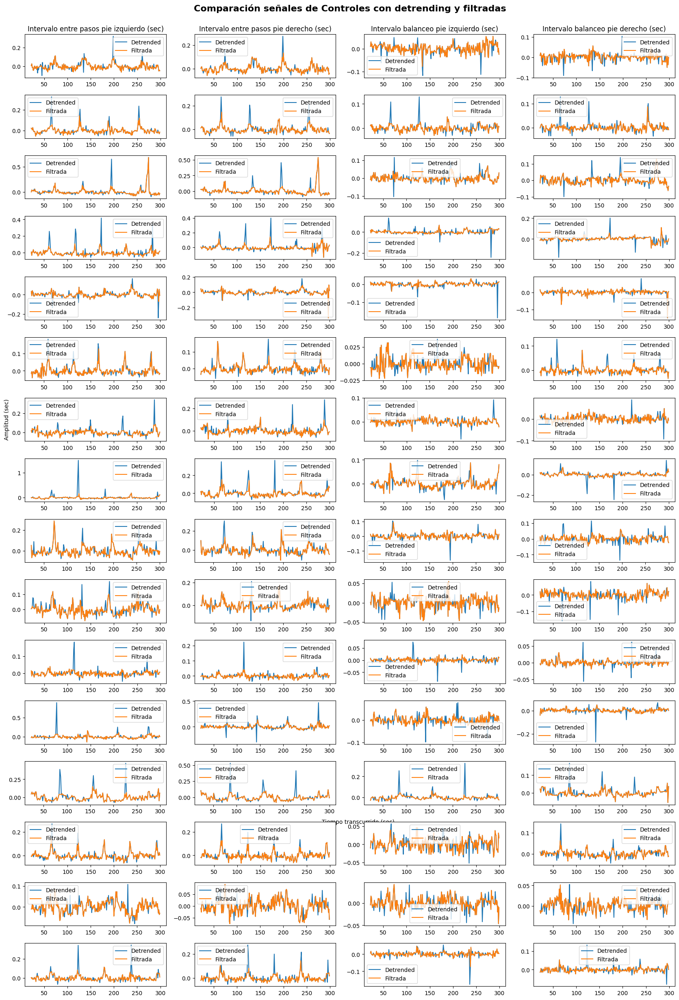

In [19]:
fig, axs = plt.subplots(16,4, figsize=(20, 30))
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, wspace=0.2, hspace=0.4)
fig.suptitle('Comparación señales de Controles con detrending y filtradas', x=0.5, y=0.905, fontsize=16, fontweight='bold')

filtered_control = []

cont_fila = 0
for senal in detrended_control:
  cont_col = 0
  senal_filtrada = np.zeros(senal.shape)
  senal_filtrada[:,0] = senal[:,0]
  for col in range(1,5):
    axs[cont_fila, cont_col].plot(senal[:,0], senal[:,col], senal[:,0], filtro_hampel(senal[:,col]))
    axs[cont_fila, cont_col].legend(['Detrended', 'Filtrada'])
    if cont_fila == 0:
      axs[cont_fila, cont_col].set_title(titulos_senales[col])
    if cont_fila == 6 and cont_col == 0:
      axs[cont_fila, cont_col].set_ylabel('Amplitud (sec)')
    if cont_fila == 12 and cont_col == 1:
      axs[cont_fila, cont_col].set_xlabel('')
      axs[cont_fila, cont_col].text(0.9, -0.4, titulos_senales[0], ha='left', va='center', transform=axs[cont_fila, cont_col].transAxes)
    senal_filtrada[:,col] = filtro_hampel(senal[:,col])
    cont_col += 1
  filtered_control.append(senal_filtrada)
  cont_fila += 1
plt.show()

<h4><b>4. </b>Crear una función que reciba una señal de marcha y calcule el coeficiente de variación (CV) y la SD tal como se define en el artículo de referencia.</h4>

<h4><b>5. </b>Crear una función que reciba una señal de marcha y permita calcular la entropía de permutación.</h4>

In [20]:
import numpy as np
from itertools import permutations
from collections import Counter

def permutation_entropy(time_series, m, tau):
    """
    Calcula la entropía de permutación de una serie temporal.

    Parámetros:
    -----------
    time_series : array-like
        La serie temporal que se analizará.
    m : int
        El tamaño de los vectores embebidos (dimensión).
    tau : int
        El retraso (lag) entre los puntos de la serie temporal.

    Retorna:
    --------
    pe : float
        El valor de la entropía de permutación.
    """

    n = len(time_series)
    if n < m * tau:
        raise ValueError("La longitud de la serie temporal es demasiado corta para el m y tau especificados.")

    # Genera todas las posibles permutaciones de dimensión m
    perm_set = list(permutations(range(m)))

    # Crear una lista de símbolos ordinales (permutaciones)
    perm_count = Counter()

    for i in range(n - (m - 1) * tau):
        # Extraer el subvector de la serie temporal con los valores espaciados por tau
        sub_vec = time_series[i:i + (m - 1) * tau + 1:tau]
        # Obtener la permutación ordinal (el orden relativo de los valores)
        sorted_idx_tuple = tuple(np.argsort(sub_vec))
        perm_count[sorted_idx_tuple] += 1

    # Calcular la distribución de probabilidades de cada permutación
    total_perms = sum(perm_count.values())
    prob_dist = np.array([count / total_perms for count in perm_count.values()])

    # Calcular la entropía de Shannon para la distribución de las permutaciones
    pe = -np.sum(prob_dist * np.log2(prob_dist))

    # Normalizar la entropía dividiéndola por el logaritmo del número de permutaciones posibles
    pe /= np.log2(len(perm_set))

    return pe

<h4><b>6. </b>Crear una rutina que aplique sobre todos los archivos de la base de datos las rutina 1 y almacene los resultados en un dataframe donde se pueda discriminar nombre participante, condición (Parkinson, Huntington, ELA, Control) y los tres índices/características calculados por cada señal</h4>

###<b>Informe</b>

a. Discusión de las diferencias en los grupos usando las gráficas obtenidas usando estadística descriptiva (25%) b. Planteamiento de las hipótesis nulas y alternativas (5%), selección del tipo de prueba (paramétrica o no paramétrica) (10%) y discusión de los resultados (10%) c. Discutir los resultados obtenidos con los presentado en el artículo base (10%) d. Proponer cuales de las medidas usadas podrían servir para discriminar que poblaciones clínicas de los controles (10%)

##<b>Referencias</b>

<b>[1]:</b> Hausdorff JM, Lertratanakul A, Cudkowicz ME, Peterson AL, Kaliton D, Goldberger AL. Dynamic markers of altered gait rhythm in amyotrophic lateral sclerosis. J Applied Physiology; 88:2045-2053, 2000.

Gait in Neurodegenerative Disease Database. Available in https://physionet.org/content/gaitndd/1.0.0/

<b>[2]:</b> CUN. (n.d.). <i>Enfermedad de Parkinson</i>. Clínica Universidad de Navarra. https://www.cun.es/enfermedades-tratamientos/enfermedades/enfermedad-parkinson

<b>[3]:</b> Mayo Clinic. (2024, 5 de abril). Mayo Clinic. <i>Enfermedad de Parkinson: diagnóstico y tratamiento</i>. https://www.mayoclinic.org/es/diseases-conditions/parkinsons-disease/diagnosis-treatment/drc-20376062

<b>[4]:</b> Vilches, G. (2021, 29 de noviembre). <i>Cómo eliminar atípicos en señales: El filtro de Hampel</i>. LinkedIn. https://www.linkedin.com/pulse/c%C3%B3mo-eliminar-at%C3%ADpicos-en-se%C3%B1ales-filtro-de-hampel-gast%C3%B3n-vilches/

<b>[5]:</b> Henry, M. (2018, 11 de diciembre). <i>Permutation entropy</i>. Aptech. https://www.aptech.com/blog/permutation-entropy/